## Introduction
This Jupyter Notebook aims to analyze the provided datasets `events.csv` and `games.csv`  to derive insights for pricing bets on goals in football matches. The notebook covers steps for data loading, merging, exploratory data analysis (EDA), and basic visualization of goal distributions.
The final df is saved as for further use of feature selection and model prediction.


In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import random
from sklearn.preprocessing import LabelEncoder

Read data and get some basic info

In [2]:
events_df = pd.read_csv('../data/events.csv')
print("Events Dataset:")
print(events_df.info())
print(events_df.describe())
events_df.head(1)

Events Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 748951 entries, 0 to 748950
Data columns (total 8 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Unnamed: 0  748951 non-null  int64 
 1   game_id     748951 non-null  int64 
 2   minute      748951 non-null  int64 
 3   scoreAway   748951 non-null  int64 
 4   scoreHome   748951 non-null  int64 
 5   second      748951 non-null  int64 
 6   state       748951 non-null  object
 7   type        748951 non-null  object
dtypes: int64(6), object(2)
memory usage: 45.7+ MB
None
          Unnamed: 0       game_id         minute      scoreAway  \
count  748951.000000  7.489510e+05  748951.000000  748951.000000   
mean   374475.000000  9.400677e+05      49.307989       0.727602   
std    216203.675066  6.380112e+04      27.291816       1.048997   
min         0.000000  7.030470e+05       1.000000       0.000000   
25%    187237.500000  8.823290e+05      26.000000       0.000000   


,Unnamed: 0,game_id,minute,scoreAway,scoreHome,second,state,type
0,0,703047,14,0,1,0,RT_FIRST_HALF,GOAL_HOME


### Data Preprocessing
1- drop un0informative column
2- preprocess column names and sort
3- Encode the event type as ['no-event', 'goal_home', 'goal_away', 'corner_home', 'corner_away']

In [3]:
# Drop the Unnamed column
events_df = events_df.loc[:, "game_id":]

# Make all string columns lower case to be consistent
events_df.state = events_df.state.str.lower()
events_df.type = events_df.type.str.lower()
events_df.sort_values(by=["game_id", "minute", "second"], inplace=True)

# Encode event types into numerical values, with 0 as no event
event_encoding = {'goal_home': 1, 'goal_away': 2, 'corner_home': 3, 'corner_away': 4}
events_df['type_encoded'] = events_df['type'].map(event_encoding)

In [4]:
events_df

,game_id,minute,scoreAway,scoreHome,second,state,type,type_encoded
0,703047,14,0,1,0,rt_first_half,goal_home,1
1,703047,27,0,1,0,rt_first_half,corner_home,3
2,703047,32,0,1,0,rt_first_half,corner_home,3
3,703047,38,0,1,0,rt_first_half,corner_home,3
4,703047,38,0,2,0,rt_first_half,goal_home,1
...,...,...,...,...,...,...,...,...
747170,1079284,61,0,0,44,rt_second_half,corner_home,3
747171,1079284,64,0,0,45,rt_second_half,corner_away,4
747172,1079284,73,0,0,37,rt_second_half,corner_away,4
747173,1079284,75,0,0,49,rt_second_half,corner_away,4


### Initial EDA on events dataset
plot the distribution of type and event times to gain insight on the frequency of specific events in specific states of the game

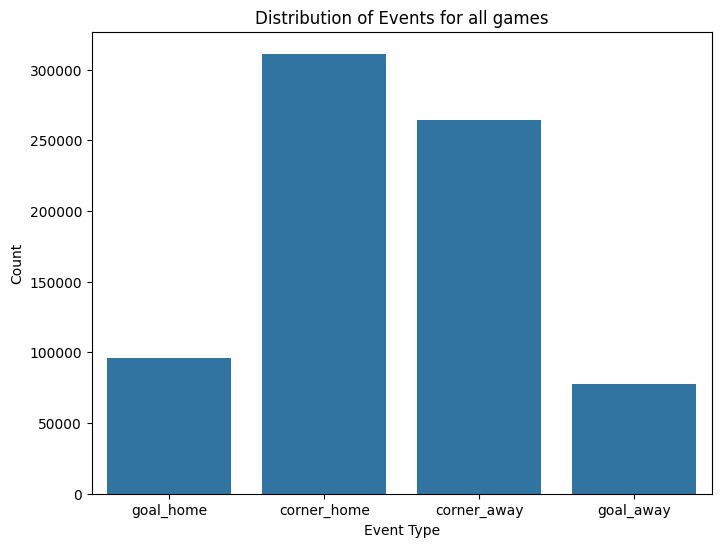

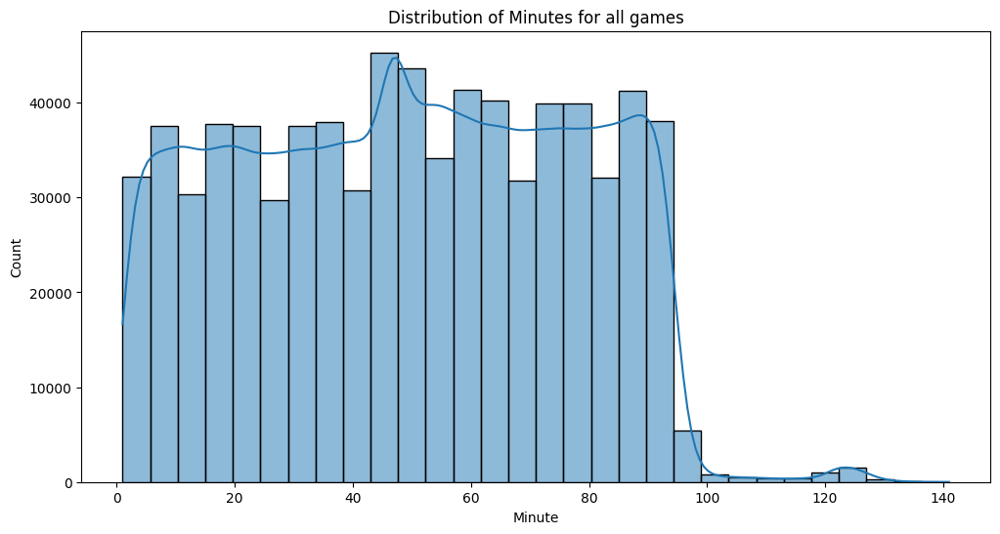

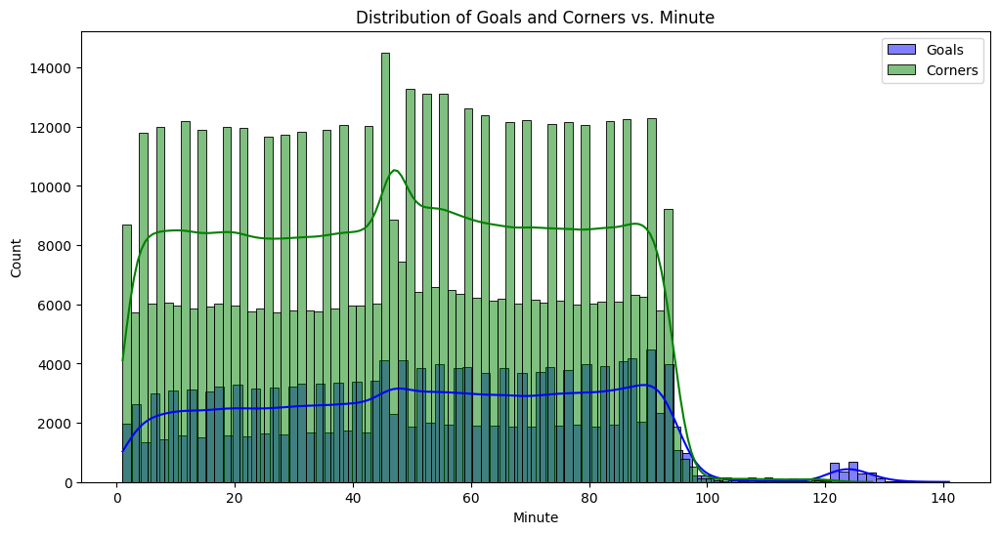

In [5]:
# Plot distribution of 'type'
plt.figure()
sns.countplot(data=events_df, x='type')
plt.title('Distribution of Events for all games')
plt.xlabel('Event Type')
plt.ylabel('Count')
plt.show()

# Plot distribution of 'minute'
plt.figure(figsize=(12, 6))
sns.histplot(data=events_df, x='minute', bins=30, kde=True)
plt.title('Distribution of Minutes for all games')
plt.xlabel('Minute')
plt.ylabel('Count')
plt.show()

# Plot distribution of goals and corners vs. minute
goals = events_df[events_df['type'].str.startswith('goal')]
corners = events_df[events_df['type'].str.startswith('corner')]

plt.figure(figsize=(12, 6))
sns.histplot(data=goals, x='minute', bins=90, color='blue', label='Goals', kde=True)
sns.histplot(data=corners, x='minute', bins=90, color='green', label='Corners', kde=True)
plt.title('Distribution of Goals and Corners vs. Minute')
plt.xlabel('Minute')
plt.ylabel('Count')
plt.legend()
plt.show()

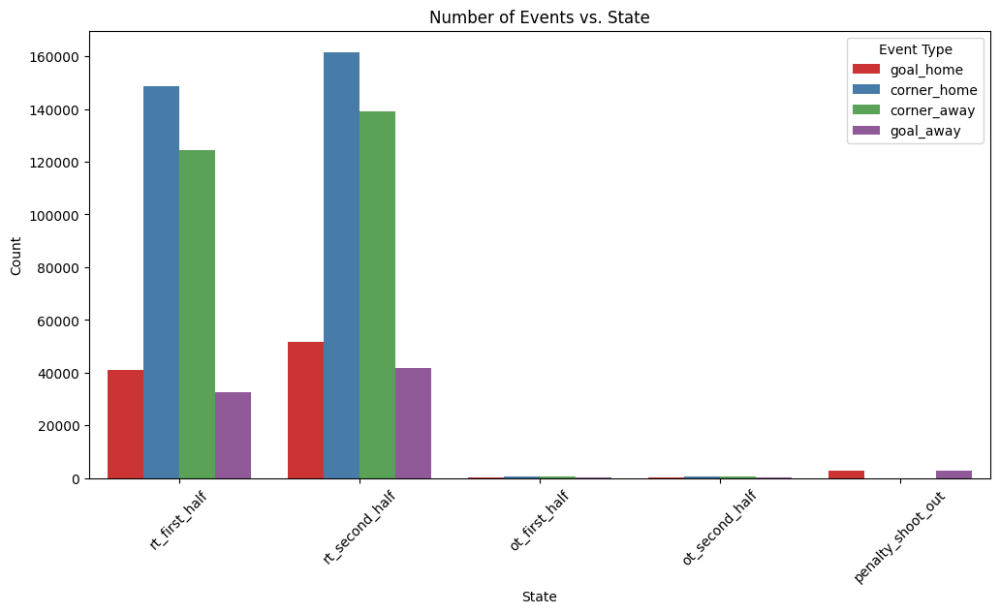

In [6]:
# Plot number of events vs. each state
plt.figure(figsize=(12, 6))
sns.countplot(data=events_df, x='state', hue='type', palette='Set1')
plt.title('Number of Events vs. State')
plt.xlabel('State')
plt.ylabel('Count')
plt.legend(title='Event Type')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

According to the depicted graphs, it appears that home teams tend to both score more goals and earn more corner kicks. As anticipated, a significant majority of events take place during regular game time, with only goals occurring during penalty time. There seems to be a rise in goal occurrences during the final minutes of the first half, and a slight uptick in overall events during the second half.

Create Sequence for each game to speed up feature engineering

Here, we generate time series sequences for each game, with a minute-by-minute granularity, based on the events and their precise minute of occurrence. We use the encoding ['no-event', 'goal_home', 'goal_away', 'corner_home', 'corner_away'] to represent the events in the time series.

In [7]:
# Get corresponding index for each game id to optimize the sequence creation with arrays
events_df['idx'], _ = pd.factorize(events_df['game_id'])

#initialize the sequence with zero as no events
sequences = np.zeros((len(events_df['game_id'].unique()), events_df["minute"].max()))

# Loop through each event and update the corresponding minute in the sequence with type_encoded
for idx, row in events_df.iterrows():
    sequences[row['idx'], row['minute'] - 1] = row['type_encoded']

sequences = sequences.astype(int)
print(sequences.shape)

(59044, 141)


For Exploratory Data Analysis (EDA) on the padded sequences, we can analyze various aspects of the data to gain insights into the distribution and patterns of events in football games.



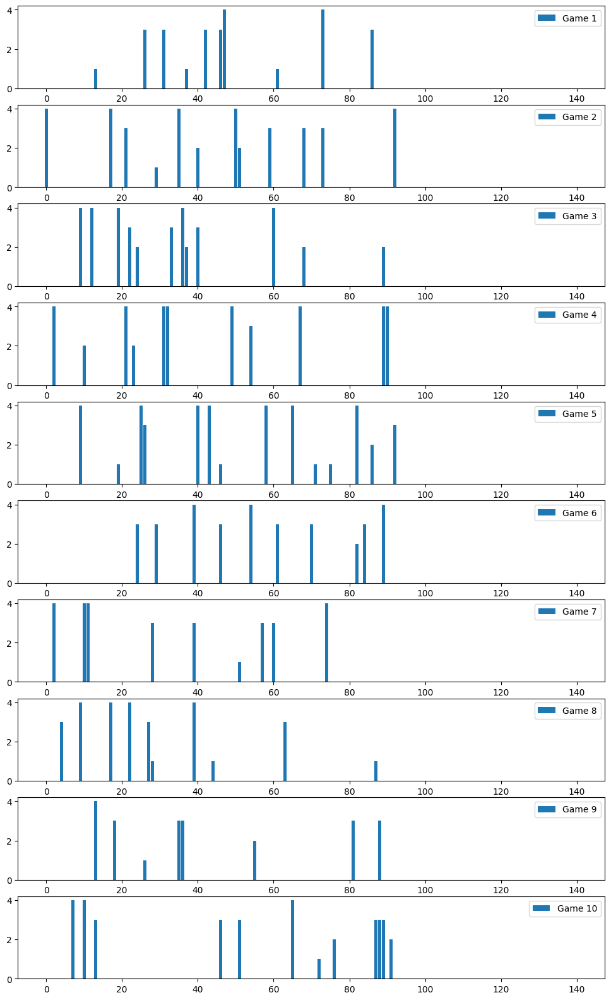

In [8]:
df = pd.DataFrame(sequences)
event_encoding = {'goal_home': 1, 'goal_away': 2, 'corner_home': 3, 'corner_away': 4}

plt.figure(figsize=(12, 20))
for i in range(10):  # Plot data for 3 games
    plt.subplot(10, 1, i+1)  # Subplot with 3 rows, 1 column, and i+1 index
    plt.bar(np.arange(df.shape[1]), df.iloc[i], label=f'Game {i+1}')
    plt.legend()
plt.show()

In [9]:
seq_df = pd.DataFrame(sequences) 
seq_df['game_id'] = events_df['game_id'].unique() # add the game_id to the created feature dataframe
print(seq_df.shape)
seq_df.head(4)

(59044, 142)


,0,1,2,3,4,5,6,7,8,9,...,132,133,134,135,136,137,138,139,140,game_id
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,703047
1,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,705604
2,0,0,0,0,0,0,0,0,0,4,...,0,0,0,0,0,0,0,0,0,708382
3,0,0,4,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,719093


### Feature Engineering
Since the events sequence is very sparse, fitting a LSTM or RNN might easily result biased results towards the majority event (which is no event). So feature engineerings seems like a good idea.

purpose is to produce features, given any sequence. So the generated features are independant of the length of the sequence and so can be generated for any given dataset.

In [10]:
## Helper functions

def get_event_num(arrays, event_Code):
    """Get away corners in the game sequences

    :param arrays: list of game sequences
    :param event_Code: (int), either 1:goal_home, 2:goal_away, 3:corner_home, 4:corner_away
    """
    return [np.count_nonzero(arr == event_Code) for arr in arrays]       

def event_freq(num_event, arrays):
    """Get freuqency of the event in comparison to game duration

    :param num_event: (list) list of integers:calculated occurances of the event so far
    :param arrays: list of game sequences
    """
    sizes = np.array([arr.size for arr in arrays])
    return num_event/sizes

def mean_std_intervals(arr, event_code):
    """mean and standard deviation of distances of consecutive occurrences

    :param arr: 2d matrix of game sequences
    :param event_Code: (int), either 1:goal_home, 2:goal_away, 3:corner_home, 4:corner_away
    """
    mean_lst = []
    std_lst = []
    intervals = []
    for row in arr:
        intervals = []
        fours_indices = np.where(row == event_code)[0] # find all occurances indices of event
        if len(fours_indices) >= 2: # if more than 2 occurances
            intervals.extend(np.diff(fours_indices))
        else:
            intervals = [0]
        mean_lst.append(np.mean(intervals))
        std_lst.append(np.std(intervals))
        
    events = ['goal_h', 'goal_a', 'corner_h', 'corner_a']
    return {f"mean_{events[event_code-1]}_intervals": mean_lst, f"std_{events[event_code-1]}_intervals": std_lst}

def events_feature_generation(arrays, game_id_list):
    """Generate all event based features for the given set of sequences

    :param arrays: 2d matrix of game sequences
    :param game_id_list: (list of strings) list of game ids to be concated to the dataframe
    """
    data = pd.DataFrame({
        'home_goals':get_event_num(arrays, 1),
        'away_goals':get_event_num(arrays, 2),
        'home_corners':get_event_num(arrays, 3),
        'away_corners':get_event_num(arrays, 4)
    })
    data = pd.concat([data, pd.DataFrame(mean_std_intervals(arrays, 1))], axis = 1)
    data = pd.concat([data, pd.DataFrame(mean_std_intervals(arrays, 2))], axis = 1)
    data = pd.concat([data, pd.DataFrame(mean_std_intervals(arrays, 3))], axis = 1)
    data = pd.concat([data, pd.DataFrame(mean_std_intervals(arrays, 4))], axis = 1)
    data["goal_h_freq"] = event_freq(data["home_goals"].values, arrays)
    data["goal_a_freq"] = event_freq(data["away_goals"].values, arrays)
    data["corner_h_freq"] = event_freq(data["home_corners"].values, arrays)
    data["corner_a_freq"] = event_freq(data["away_corners"].values, arrays)
    data['game_id'] = game_id_list
    return data


def extract_two_strings(match_string, splitter):
    """Extracts the two strings from athe given match string

    :param match_string: (str) the string containing two words separated by splitter.
    :param splitter: (str) the string which is used for splitting
    :return: (list) list of two strings, the two words before and after splitter.
    Example:
    >>> extract_team_names("Deportivo Saprissa v Club Sport Heredian", " v ")
    ['Deportivo Saprissa', 'Club Sport Heredian']

    >>> extract_team_names("a vs b", " v ")
    [a vs b]
    >>> extract_team_names("a b v c", " v ")
    ['a b', 'c']
    """
    # Split the match string at splitter and strip whitespace from team names
    names = [name.strip() for name in match_string.split(splitter)]
    
    # edge case if the two words are not extracted, return empty string
    if len(names) != 2:
        return match_string
    
    return names[:2]  # AMGIC: 2 to make sure the first two are only returned

### Create Dataset
for dataset creation, we choose random time stamps of the games to include all possible scenrios. We also need to import games.csv to get some features like team names and leagues from that csv file.
The two other important features to be added are game length so far and game length remained.

In [11]:
games_df = pd.read_csv('../data/games.csv')
# drop the Unnamed column
games_df = games_df.loc[:, "game_id":]

# make all string columns lowe case to be consistent
games_df.description = games_df.description.str.lower()
games_df.league = games_df.league.str.lower()
games_df.sort_values(by=["game_id","date"], inplace=True)
games_df.head(4)


,game_id,date,description,league
0,703047,26/08/2016 13:00,fc dynamo kyiv u21 v fc vorskla poltava u21,ukraine - u21 league
1,705604,30/08/2016 15:30,fc kiffen v hjk helsinki ii (klubi 04),finland - kakkonen - group b
3,708382,09/09/2016 14:00,fk desna chernihiv v fc kolos kovalivka,ukraine - persha liga
2,719093,06/09/2016 14:30,fk lida v fc shakhtyor soligorsk,belarus - cup


In [12]:
# EXTRACT features from games_df
## Get team names from the description column
games_df[['team1', 'team2']] = games_df['description'].apply(lambda x: pd.Series(extract_two_strings(x, " v ")))
label_encoder = LabelEncoder() # econde team columms in place
games_df['encoded_team1'] = label_encoder.fit_transform(games_df['team1'])
games_df['encoded_team2'] = label_encoder.fit_transform(games_df['team2'])

## Get features from leauge description column
games_df['friendly'] = games_df['league'].apply(lambda x: 1 if "friendly" in x else 0)
games_df['u21'] = games_df['league'].apply(lambda x: 1 if "u21" in x else 0)
games_df['cup'] = games_df['league'].apply(lambda x: 1 if "cup" in x else 0)

# keep only features columns
games_df = games_df[['game_id', 'encoded_team1', 'encoded_team2', 'friendly', 'u21', 'cup']]
games_df.head(4)


,game_id,encoded_team1,encoded_team2,friendly,u21,cup
0,703047,2563,3094,0,1,0
1,705604,2650,4067,0,0,0
3,708382,3025,2863,0,0,0
2,719093,3106,3001,0,0,1


In [33]:
# Given pred points, extract features from sequences dataframe
max_time = 90  # Investigating only first 90 mins
random.seed(42)

# timestamp of prediction point, resulting in complementary input and output seqs, with different sizes
pred_point = [random.randint(10, max_time-10) for _ in range(sequences.shape[0])]
input_sequence = [seq[0:point] for seq, point in zip(sequences, pred_point)]
input_events_df = events_feature_generation(input_sequence, events_df["game_id"].unique())
input_events_df["time_gone"] = np.array(pred_point)
input_events_df["time_left"] = max_time - np.array(pred_point)
input_events_df.head(4)

,home_goals,away_goals,home_corners,away_corners,mean_goal_h_intervals,std_goal_h_intervals,mean_goal_a_intervals,std_goal_a_intervals,mean_corner_h_intervals,std_corner_h_intervals,mean_corner_a_intervals,std_corner_a_intervals,goal_h_freq,goal_a_freq,corner_h_freq,corner_a_freq,game_id,time_gone,time_left
0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.050000,0.000000,0.000000,0.000000,703047,20,70
1,1,2,3,4,0.0,0.0,11.0,0.0,23.5,14.5,16.666667,1.247219,0.013889,0.027778,0.041667,0.055556,705604,72,18
2,0,2,3,4,0.0,0.0,13.0,0.0,9.0,2.0,9.000000,5.887841,0.000000,0.038462,0.057692,0.076923,708382,52,38
3,0,2,1,6,0.0,0.0,13.0,0.0,0.0,0.0,13.000000,6.782330,0.000000,0.026316,0.013158,0.078947,719093,76,14


In [23]:
# Generate ouput dataframe, we mainly use the home goals and away goals from this dataset as y
output_sequence = [seq[point:max_time+1] for seq, point in zip(sequences, pred_point)]
output_events_df = events_feature_generation(output_sequence, events_df["game_id"].unique())
output_events_df.head(4)

,home_goals,away_goals,home_corners,away_corners,mean_goal_h_intervals,std_goal_h_intervals,mean_goal_a_intervals,std_goal_a_intervals,mean_corner_h_intervals,std_corner_h_intervals,mean_corner_a_intervals,std_corner_a_intervals,goal_h_freq,goal_a_freq,corner_h_freq,corner_a_freq,game_id
0,2,0,5,2,24.0,0.0,0.000000,0.000000,15.0,14.679918,26.000000,0.000000,0.030769,0.000000,0.076923,0.030769,703047
1,0,0,0,0,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,705604
2,0,4,3,4,0.0,0.0,21.666667,7.363574,9.0,2.000000,16.000000,6.976150,0.000000,0.050633,0.037975,0.050633,708382
3,0,0,1,4,0.0,0.0,0.000000,0.000000,0.0,0.000000,13.666667,9.104334,0.000000,0.000000,0.020408,0.081633,719093


In [16]:
# The dataset to work with
X = pd.merge(input_events_df, games_df, on='game_id')
X.sort_values('game_id', inplace=True)
X.set_index("game_id", inplace=True, drop=True)
X.head(4)


,home_goals,away_goals,home_corners,away_corners,mean_goal_h_intervals,std_goal_h_intervals,mean_goal_a_intervals,std_goal_a_intervals,mean_corner_h_intervals,std_corner_h_intervals,...,goal_a_freq,corner_h_freq,corner_a_freq,time_gone,time_left,encoded_team1,encoded_team2,friendly,u21,cup
game_id,,,,,,,,,,,,,,,,,,,,,
703047,1,0,0,0,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.000000,0.00,0.000000,26,64,2563,3094,0,1,0
705604,1,2,4,4,0.0,0.0,11.0,0.0,17.333333,14.704497,...,0.025000,0.05,0.050000,80,10,2650,4067,0,0,0
708382,0,0,0,1,0.0,0.0,0.0,0.0,0.000000,0.000000,...,0.000000,0.00,0.083333,12,78,3025,2863,0,0,0
719093,0,2,0,4,0.0,0.0,13.0,0.0,0.000000,0.000000,...,0.047619,0.00,0.095238,42,48,3106,3001,0,0,1


In [24]:
y = output_events_df[["game_id", "home_goals", "away_goals"]]
y.sort_values('game_id', inplace=True)
y.set_index("game_id", inplace=True, drop=True)
y.head(4)

C:\Users\arefm\AppData\Local\Temp\ipykernel_11400\656896789.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  y.sort_values('game_id', inplace=True)


,home_goals,away_goals
game_id,,
703047,2,0
705604,0,0
708382,0,4
719093,0,0


,home_goals,away_goals
count,59044.000000,59044.000000
mean,0.820219,0.660474
std,1.048319,0.929292
min,0.000000,0.000000
25%,0.000000,0.000000
50%,1.000000,0.000000
75%,1.000000,1.000000
max,16.000000,20.000000


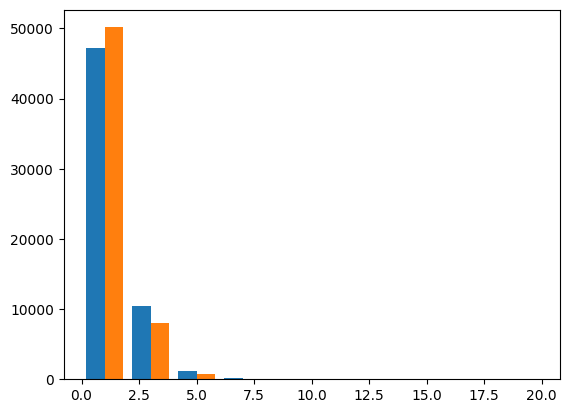

In [29]:
plt.hist(y, bins=10)
y.describe()


Describing the output values, shows that the distribution is skewed and the median number of goals is around 1, so we expect the results to be biased towards 1 goal. To overcome this problem we can smaple more from the dataset to diversify the game scenarios.

Also any number of goals above 5 seems like an outlier and in further analysis, these outliers can be removed. 

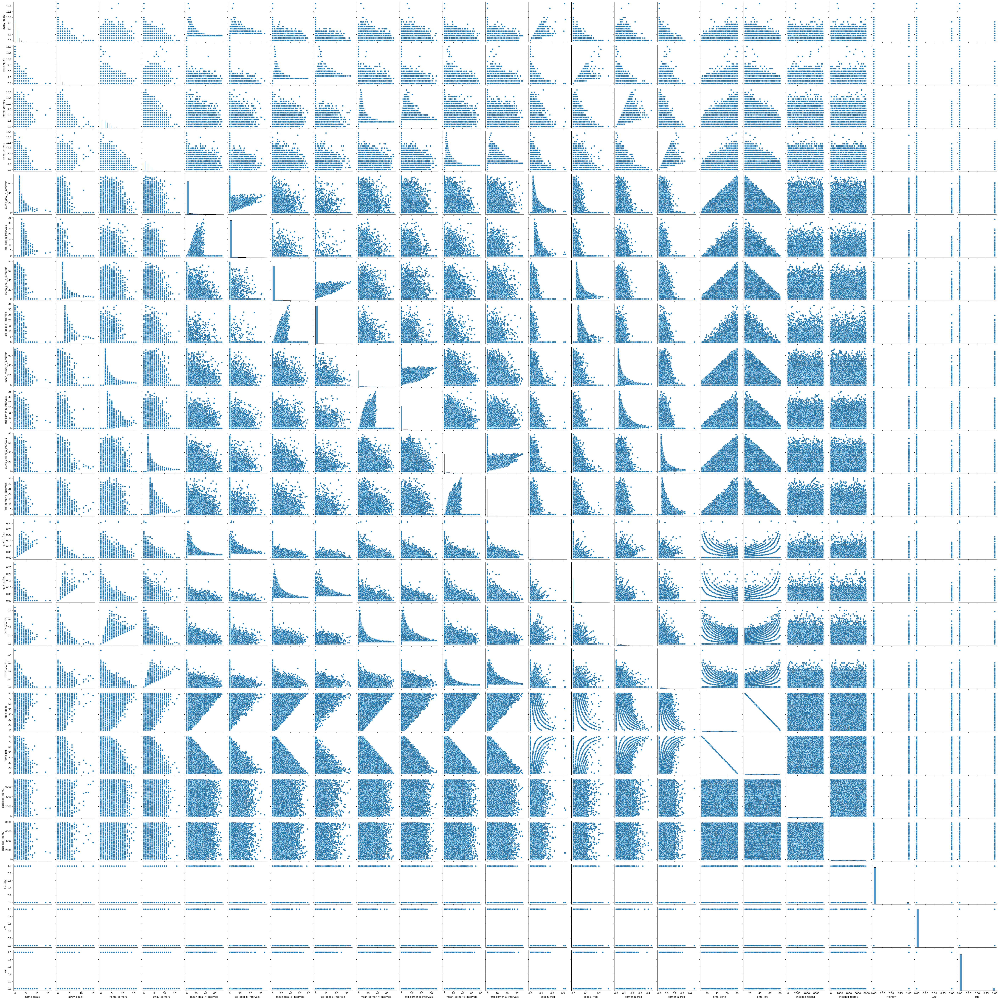

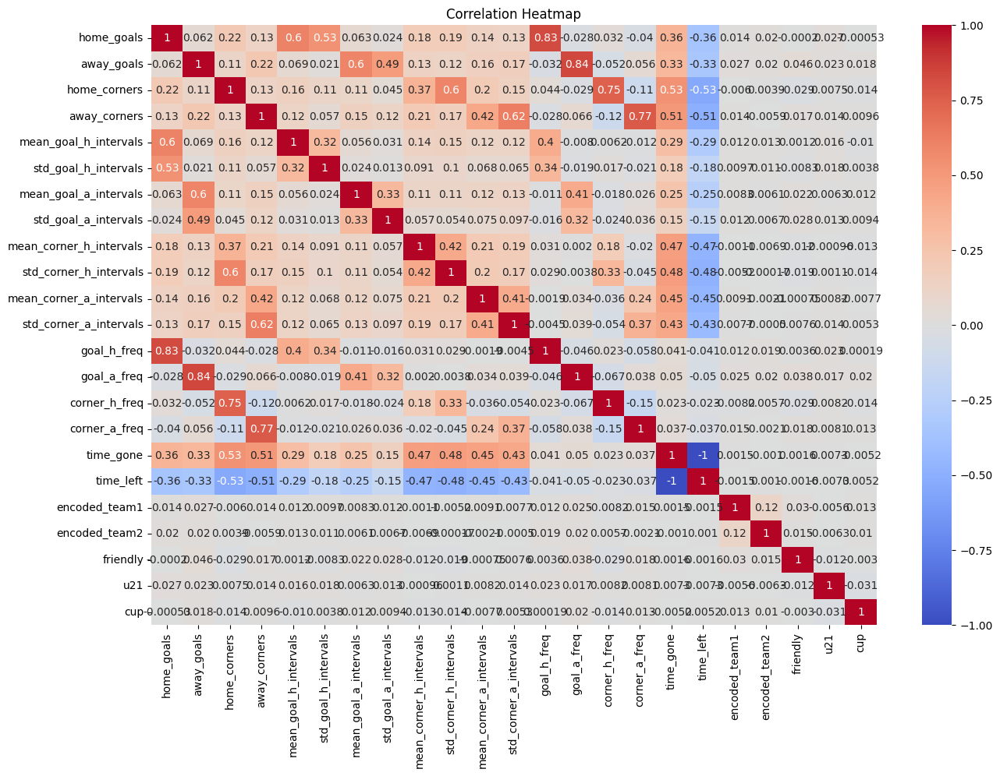

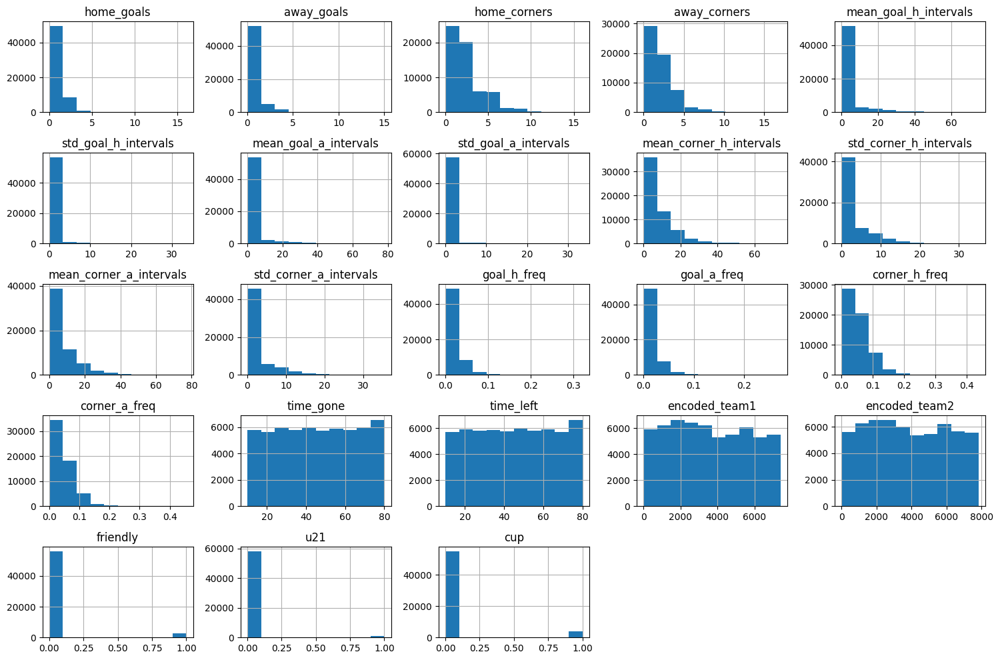

In [26]:
sns.pairplot(X)
plt.show()

# Correlation heatmap
plt.figure(figsize=(15, 10))
correlation_matrix = X.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

# Histograms
X.hist(figsize=(15, 10))
plt.tight_layout()
plt.show()

based on the above diagrams, there seems to be a correlation between the home goal and intervals, however, since the task is a forecasting task, this observed correlation might not be causal when predicting next goal numbers using the past information.

You can also observer some correlation between goals and corners which makes sense intuitively, as it indicates more pressure on the opposite team's goal.

The correlation matrix also reveals very little correlation between the league type, and teams names and the number of goals.

In [25]:
## store the datasets
X.to_csv('../data/X.csv')
y.to_csv('../data/y.csv')